# Introduction

Welcome to my first notebook! This project was completed as the capstone project for the IBM Data Science specialization on Coursera. 

In this notebook, I will try to cluster the districts of Munich. The main objective is to label clusters of Munich and interpret each correctly. The result will be a true-to-life division of Munich into residential and entertainment (life night or other touristic attractions) areas. I will try to tell a story through data and enhance it through compelling visualizations. At the end of this notebook, prospective tourists should have a good idea about what districts to visit to make the most out of their visit to Munich.

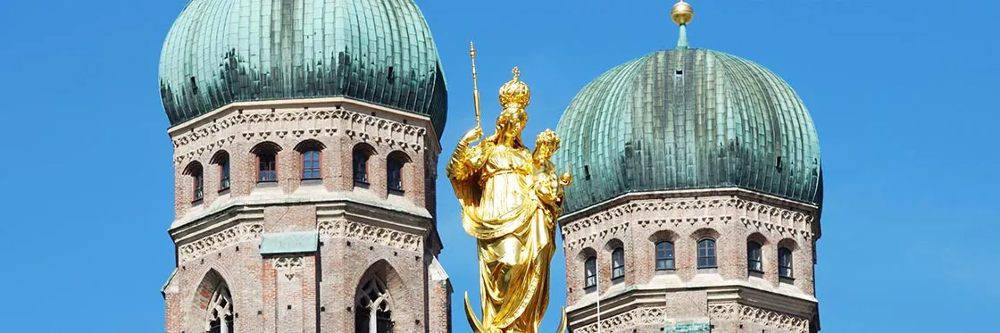

# Data

The postcodes for different districts of Munich are readily available on the city's website. I will scrape the website for the postcodes, create a preliminary data frame, then wrangle this data in this data frame to structure it in a way that I can utilize for making calls to the Foursquare and Google Maps API.

In [1]:
# libraries for data manipulation, visualization, and ML
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans

from matplotlib import pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns

# libraries for web scraping
import requests
from bs4 import BeautifulSoup

import folium # for maps 

API_KEY = 'YOUR GOOGLE MAPS API KEY HERE' # for calls to the google maps API
CLIENT_ID = 'YOUR FS CLIENT ID HERE' # Foursquare ID
CLIENT_SECRET = 'YOUR FS CLIENT SECRET HERE' # Foursquare Secret

sns.set_style("darkgrid")

Let's get the district names and the postal codes in each district from Munich's city website and set up the initial data frame.

In [2]:
url = 'https://www.muenchen.de/int/en/living/postal-codes.html'
presoup = requests.get(url).text
soup = BeautifulSoup(presoup)


# scrape the table on the website
table = soup.find('table')

contents = []

for row in table.findAll('tr')[1:]: # skipping the header row
    sample = row.findAll('td') # 2 columns; district and the postal code
    print("Adding...")
    print(sample[0].text, ';', sample[1].text)
    print()
    cell = {}
    cell['District'] = sample[0].text
    cell['PostCode'] = sample[1].text
    contents.append(cell)

# create a data rame out of the contents list

df = pd.DataFrame(contents)

display(df.head())

Adding...
Allach-Untermenzing ; 80995, 80997, 80999, 81247, 81249

Adding...
Altstadt-Lehel ; 80331, 80333, 80335, 80336, 80469, 80538, 80539

Adding...
Au-Haidhausen ; 81541, 81543, 81667, 81669, 81671, 81675, 81677

Adding...
Aubing-Lochhausen-Langwied ; 81243, 81245, 81249

Adding...
Berg am Laim ; 81671, 81673, 81735, 81825

Adding...
Bogenhausen ; 81675, 81677, 81679, 81925, 81927, 81929

Adding...
Feldmoching-Hasenbergl ; 80933, 80935, 80995

Adding...
Hadern ; 80689, 81375, 81377

Adding...
Laim ; 80686, 80687, 80689

Adding...
Ludwigsvorstadt-Isarvorstadt ; 80335, 80336, 80337, 80469

Adding...
Maxvorstadt ; 80333, 80335, 80539, 80636, 80797, 80798, 80799, 80801, 80802

Adding...
Milbertshofen-Am Hart ; 80807, 80809, 80937, 80939

Adding...
Moosach ; 80637, 80638, 80992, 80993, 80997

Adding...
Neuhausen-Nymphenburg ; 80634, 80636, 80637, 80638, 80639

Adding...
Obergiesing ; 81539, 81541, 81547, 81549

Adding...
Pasing-Obermenzing ; 80687, 80689, 81241, 81243, 81245, 81247

Ad

,District,PostCode
0,Allach-Untermenzing,"80995, 80997, 80999, 81247, 81249"
1,Altstadt-Lehel,"80331, 80333, 80335, 80336, 80469, 80538, 80539"
2,Au-Haidhausen,"81541, 81543, 81667, 81669, 81671, 81675, 81677"
3,Aubing-Lochhausen-Langwied,"81243, 81245, 81249"
4,Berg am Laim,"81671, 81673, 81735, 81825"


The rows of the PostCode feature are not suitable for analysis in their current form. Let's unstack the PostCode rows into separate rows so that we can run geo-queries on each District/PostCode combination separately.

In [3]:
df = df.assign(var1 = df['PostCode'].str.split(',')).explode('var1')

In [4]:
# let's check if the explode method worked as intended

count = 0
for i, row in df.iterrows():
    if row.var1 in row.PostCode:
        count += 1

print(count == df.shape[0]) # no NaN's
print("We have {} unique district - post code combinations.".format(df.shape[0]))

True
We have 127 unique district - post code combinations.


We can drop the PostCode column while we are at it. By dropping it, we can give its name to name the new column.

In [5]:
# the data frame after exploding the PostCode column
df.head()

,District,PostCode,var1
0,Allach-Untermenzing,"80995, 80997, 80999, 81247, 81249",80995
0,Allach-Untermenzing,"80995, 80997, 80999, 81247, 81249",80997
0,Allach-Untermenzing,"80995, 80997, 80999, 81247, 81249",80999
0,Allach-Untermenzing,"80995, 80997, 80999, 81247, 81249",81247
0,Allach-Untermenzing,"80995, 80997, 80999, 81247, 81249",81249


In [6]:
df.drop(labels = 'PostCode', inplace = True, axis = 1)
df.rename(columns = {'var1' : 'PostCode'}, inplace = True)
df.head() # the cleaned up DF

,District,PostCode
0,Allach-Untermenzing,80995
0,Allach-Untermenzing,80997
0,Allach-Untermenzing,80999
0,Allach-Untermenzing,81247
0,Allach-Untermenzing,81249


It's now time to append latitude and longitude information to each row.

Here's an example of how to get the latitude and longitude of a single location. I will turn this into a function that can get called on each row of my data frame.

In [7]:
address = '1600+Amphitheatre+Parkway,+Mountain+View,+CA' # the space chars are represented as '+'

url = 'https://maps.googleapis.com/maps/api/geocode/json?key={0}&address={1}'.format(API_KEY, address)

response = requests.get(url)

resp_json_payload = response.json()

print(resp_json_payload['results'][0]['geometry']['location']) # dict with two keys: latitude and longitude

{'lat': 37.4240109, 'lng': -122.0867615}


In [8]:
def getLatLon(row):
    
    """The helper function to retrieve the latitude and longitude information of an address
    with the Google Maps API calls.
    
    Works on each row of the data frame individually."""
    
    address = str(row['PostCode']) +', ' + str(row['District']) + ', ' + 'Munich'
    
    # api key is declared before calling the function
    url = 'https://maps.googleapis.com/maps/api/geocode/json?key={0}&address={1}'.format(API_KEY, address)
    response = requests.get(url)

    resp_json_payload = response.json()
    
    latitude = resp_json_payload['results'][0]['geometry']['location']['lat']
    longitude = resp_json_payload['results'][0]['geometry']['location']['lng']  
    
    return latitude, longitude

Now it's time to populate the data frame. Since the *getLatLon* function will make calls to the API a few times, this might take a while.

In [9]:
df['geometry'] = df.apply(lambda row: getLatLon(row), axis = 1)

# separate the tuple into two columns
df['Latitude'] = df.geometry.apply(lambda row: row[0])
df['Longitude'] = df.geometry.apply(lambda row: row[1])
df.drop(labels = 'geometry', inplace = True, axis = 1)
df.reset_index(inplace = True, drop = True) 

# explode will make it so that everything on the same row will have the same index, thus .reset_index()

# one final touch: the some of the post code strings on muenchen.de have a whitespace character in fron of them
df.PostCode = df.PostCode.str.strip()

In [10]:
df.head()

,District,PostCode,Latitude,Longitude
0,Allach-Untermenzing,80995,48.211504,11.513181
1,Allach-Untermenzing,80997,48.189239,11.484286
2,Allach-Untermenzing,80999,48.193065,11.446326
3,Allach-Untermenzing,81247,48.168436,11.465909
4,Allach-Untermenzing,81249,48.167851,11.396597


Let's visualize the neighborhoods on a map as a sanity check.

In [11]:
# create a map of Munich using latitude and longitude values
# Latitude and Longitude variables are taken from https://www.latlong.net/place/munich-bavaria-germany-9693.html

Latitude = 48.137154
Longitude = 11.576124

map_munich = folium.Map(location = [Latitude, Longitude], zoom_start = 11)

# add markers to map
for lat, lng, district, neighborhood in zip(df['Latitude'], df['Longitude'], df['District'], df['PostCode']):
    label = '{}, {} \n {}, {}'.format(neighborhood, district, lat, lng)
    label = folium.Popup(label, parse_html = True)
    folium.CircleMarker(
        [lat, lng],
        radius = 5,
        popup = label,
        color = 'blue',
        fill = False,
        fill_color = 'red',
        fill_opacity = 1,
        parse_html = False,
        tooltip = '{}: {}'.format(lat, lng)
).add_to(map_munich)  
    
map_munich

The location points got scattered in a way that makes sense, but it doesn't look like I have 127 points on this map. This might mean that I have duplicate latitude & longitude combinations. The culprit here is most likely a postcode shared between multiple districts. 

Let's see if we have duplicate records, and if yes, how many.

In [12]:
mask = df.duplicated(subset = ['Latitude', 'Longitude']) # latitude AND longitude combination

display(df[mask].head(10))

print(f"We have {df[mask].shape[0]} duplicate records.")

,District,PostCode,Latitude,Longitude
21,Aubing-Lochhausen-Langwied,81249,48.167851,11.396597
22,Berg am Laim,81671,48.123408,11.612097
26,Bogenhausen,81675,48.138139,11.603351
27,Bogenhausen,81677,48.136598,11.630744
34,Feldmoching-Hasenbergl,80995,48.211504,11.513181
40,Laim,80689,48.130779,11.490008
41,Ludwigsvorstadt-Isarvorstadt,80335,48.144338,11.554824
42,Ludwigsvorstadt-Isarvorstadt,80336,48.134036,11.557173
44,Ludwigsvorstadt-Isarvorstadt,80469,48.128645,11.573070
45,Maxvorstadt,80333,48.144099,11.569553


We have 53 duplicate records.


This explains why the map doesn't look quite right. It should have been more cluttered but some of the labels obviously got overridden. Let's take a closer look at an example.

In [13]:
mask1 = df.PostCode == '80335' # try it out with some random post code

df[mask1]

,District,PostCode,Latitude,Longitude
7,Altstadt-Lehel,80335,48.144338,11.554824
41,Ludwigsvorstadt-Isarvorstadt,80335,48.144338,11.554824
46,Maxvorstadt,80335,48.144338,11.554824
101,Schwanthalerhöhe,80335,48.144338,11.554824


If we scroll up to the interactive Munich map, we can see that this point is labeled *Schwanthalerhöhe 80335*. What's happening is that as labels get added to each point in the loop, the 7th row gets overridden by 41st, which then gets overridden by 46th, which in turn gets overridden by 101st.

I will drop the duplicated rows before continuing working with the Foursquare API as the FS queries depend on latitude and longitude combinations. 

I'll keep the last occurrences for the sake of simplicity. An alternative could be to go in, remove the duplicates, and rename the districts as we see fit (maybe rename **Schwanthalerhöhe** cell to **Maxvorstadt**). I'll visualize the locations once more with the no-duplicates data frame.

In [14]:
df.drop_duplicates(subset = ['Latitude', 'Longitude'], keep = 'last', inplace = True, ignore_index = True)

df.shape[0] # should be 74 samples

74

In [15]:
# same map as before!

Latitude = 48.137154
Longitude = 11.576124

map_munich = folium.Map(location = [Latitude, Longitude], zoom_start = 12)

# add markers to map
for lat, lng, district, neighborhood in zip(df['Latitude'], df['Longitude'], df['District'], df['PostCode']):
    label = '{}, {} \n {}, {}'.format(neighborhood, district, lat, lng)
    label = folium.Popup(label, parse_html = True)
    folium.CircleMarker(
        [lat, lng],
        radius = 5,
        popup = label,
        color = 'yellow',
        fill = False,
        fill_color = 'red',
        fill_opacity = 0.4,
        parse_html = False,        
        tooltip='{}: {}'.format(lat, lng)
        ).add_to(map_munich)  
    
map_munich

The markers seem to be neatly distributed over the city as we expected.

Seems like the data frame is all ready for use! We can now utilize the latitude and longitude information to delve further into the different neighborhoods in each district.

I will make calls to the Foursquare API to delve deeper into the local attractions of Munich.

In [16]:
VERSION = '20210715' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentials:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentials:
CLIENT_ID: ...
CLIENT_SECRET:...


Let's first see what I can make with Munich's default geometric data.

In [17]:
LIMIT = 100 # 100 nearby venues per lat&lon
radius = 500 # 500 meter search radius

Latitude = 48.137154
Longitude = 11.576124

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    Latitude, 
    Longitude, 
    radius, 
    LIMIT)

results = requests.get(url).json()

# make sure the query was successful
assert(results['meta']['code'] == 200)

# the list of nearby venues
venues = results['response']['groups'][0]['items']

nearby_venues = pd.json_normalize(venues) # flatten JSON
display(nearby_venues.head())

,referralId,reasons.count,reasons.items,venue.id,venue.name,venue.location.address,venue.location.lat,venue.location.lng,venue.location.distance,venue.location.postalCode,...,venue.location.state,venue.location.country,venue.location.formattedAddress,venue.categories,venue.photos.count,venue.photos.groups,venue.location.labeledLatLngs,venue.location.neighborhood,venue.location.crossStreet,venue.venuePage.id
0,e-0-4ade0ccef964a520246921e3-0,0,"[{'summary': 'This spot is popular', 'type': '...",4ade0ccef964a520246921e3,Marienplatz,Marienplatz,48.137175,11.575533,43,80331,...,Bayern,Deutschland,"[Marienplatz, 80331 München, Deutschland]","[{'id': '4bf58dd8d48988d164941735', 'name': 'P...",0,[],NaN,NaN,NaN,NaN
1,e-0-4b59e1fbf964a520189e28e3-1,0,"[{'summary': 'This spot is popular', 'type': '...",4b59e1fbf964a520189e28e3,Fischbrunnen,Marienplatz,48.137211,11.576047,8,80331,...,Bayern,Deutschland,"[Marienplatz, 80331 München, Deutschland]","[{'id': '56aa371be4b08b9a8d573547', 'name': 'F...",0,[],"[{'label': 'display', 'lat': 48.13721054807242...",NaN,NaN,NaN
2,e-0-5d8df0ec1c7459000860a7fe-2,0,"[{'summary': 'This spot is popular', 'type': '...",5d8df0ec1c7459000860a7fe,Sweet Spot,Heiliggeiststr. 1,48.135765,11.577575,188,80331,...,Bayern,Deutschland,"[Heiliggeiststr. 1, 80331 München, Deutschland]","[{'id': '4bf58dd8d48988d1e0931735', 'name': 'C...",0,[],"[{'label': 'display', 'lat': 48.135765, 'lng':...",NaN,NaN,NaN
3,e-0-4ade0d22f964a520fa6a21e3-3,0,"[{'summary': 'This spot is popular', 'type': '...",4ade0d22f964a520fa6a21e3,Alois Dallmayr,Dienerstr. 14-15,48.138469,11.577372,173,80331,...,Bayern,Deutschland,"[Dienerstr. 14-15, 80331 München, Deutschland]","[{'id': '4bf58dd8d48988d1f5941735', 'name': 'G...",0,[],"[{'label': 'display', 'lat': 48.1384687, 'lng'...",NaN,NaN,NaN
4,e-0-4ade0cd2f964a520396921e3-4,0,"[{'summary': 'This spot is popular', 'type': '...",4ade0cd2f964a520396921e3,St. Peter,Rindermarkt 1,48.136530,11.575615,79,80331,...,Bayern,Deutschland,"[Rindermarkt 1, 80331 München, Deutschland]","[{'id': '4bf58dd8d48988d132941735', 'name': 'C...",0,[],"[{'label': 'display', 'lat': 48.13653033744336...",Angerviertel,NaN,NaN


This data frame is as messy as they come. Let's do some cleaning up.

In [18]:
def get_category_type(row):
    
    """Helper function that extracts the category of the venue"""
    
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [19]:
# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues = nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]
nearby_venues.rename(columns = {'name': 'Venue Name', 'categories': 'Category',
                                'lat': 'Venue Latitude', 'lng': 'Venue Longitude'}, inplace = True)
nearby_venues.head()

,Venue Name,Category,Venue Latitude,Venue Longitude
0,Marienplatz,Plaza,48.137175,11.575533
1,Fischbrunnen,Fountain,48.137211,11.576047
2,Sweet Spot,Coffee Shop,48.135765,11.577575
3,Alois Dallmayr,Gourmet Shop,48.138469,11.577372
4,St. Peter,Church,48.136530,11.575615


I intend to run the code one cell above on all the latitude and longitude pairs in each row. Since it would be impractical to run it for each row one by one, let's turn that into a well-structured function that could get applied to the entire data frame. 

The end goal is to get a data frame that in each row contains:

 - The neighborhood name
 - The neighborhood's postcode
 - The latitude and the longitude of the neighborhood
 - The venue name, its geometric information, and its category

Before calling the function, I will have to decide on the search radius. I used a good, round figure (500 meters) on the first call to see what I could come up with. Is there a better search radius, or should I keep it as 500 meters? 

Let's scatter our latitude and longitudes to see how densely spaced they are. If the visual inspection shows that they are close to each other (which I know to be the case in Schwabing and Maxvorstadt), I will alter the search radius.

In [20]:
# same map, to showcase the overlaps

Latitude = 48.137154
Longitude = 11.576124

map_munich = folium.Map(location = [Latitude, Longitude], zoom_start = 12)

# add markers to map
for i, (lat, lng, district, neighborhood) in enumerate(zip(df['Latitude'], df['Longitude'], df['District'], df['PostCode'])):
    label = '{}, {} \n {}, {}'.format(neighborhood, district, lat, lng)
    label = folium.Popup(label, parse_html = True)
    folium.Circle(
        location=[lat, lng],
        popup = label,
        radius = 500, # same amount of meters I used in my FS API call
        color = 'blue',
        fill_color = 'blue',
        fill_opacity = 0.2,
        parse_html = False,
        tooltip = '{}. {}, {} \n {}, {}'.format(i, neighborhood, district, lat, lng)
    ).add_to(map_munich)  
    
map_munich

It seems like there will be a lot of overlap (especially in the city center). Let's get the nearest neighbor of each point, calculate the distance to the nearest neighbor, and show the overlap on a Folium map.

The nearest neighbor in linear space is solved with KDTRee since the relevant metric will be [Minkowski distance](https://en.wikipedia.org/wiki/Minkowski_distance) (p = 2 on a flat 2-D surface, a.k.a. Euclidean distance). However, NN on a sphere's surface will need the [Haversine distance](https://en.wikipedia.org/wiki/Haversine_formula) as the relevant metric, for which the Ball Tree search algorithm could be used.

In [21]:
dataA = pd.DataFrame((df['Latitude'], df['Longitude'])).T # dummy df for distance calculations

from sklearn.neighbors import KDTree
tree = KDTree(dataA)
nearest_distKDT, nearest_indKDT = tree.query(dataA, k = 2)  # k = 2 nearest neighbors where k1 = identity

print("The distances: first column is identity, second column is the NN.")
print(nearest_distKDT[:,:][:10])
print()
print("Indices of the values of the second column:")
print(nearest_indKDT[:, 1][:10]) # drop id 

The distances: first column is identity, second column is the NN.
[[0.         0.03133198]
 [0.         0.00756748]
 [0.         0.00818135]
 [0.         0.03810189]
 [0.         0.01056254]
 [0.         0.00715057]
 [0.         0.01056254]
 [0.         0.00715057]
 [0.         0.01746549]
 [0.         0.01649833]]

Indices of the values of the second column:
[31 56  5 31  6  7  4  5 41 10]


Let's see if the results we got stand to reason. 

The KDTree found the closest neighbor of the first row to be the 32nd row (index 31).

Let's calculate the Euclidean distance between the two samples (ignoring the z-direction) and see if it's equal to the distance output by the KDTree.

In [22]:
Lon1, Lat1 = df.iloc[0].Longitude, df.iloc[0].Latitude # 1st sample
Lon2, Lat2 = df.iloc[31].Longitude, df.iloc[31].Latitude # 32nd sample

calculatedDistance = np.sqrt((Lon2-Lon1)**2 + (Lat2-Lat1)**2)
print(calculatedDistance) # simple Euclidean distance by me
print(nearest_distKDT[0][1]) # distance as calculated by KDTree between these two samples

0.03133197892393731
0.03133197892393731


The KDTree indeed performs as intended. I should use an iterative radius on each sample, convert this to meters, divide by half, and search for locations within that perimeter.

Although this solution is satisfactory, the distances are not as accurate as they could be because the Euclidean distance is calculated on a 2-D surface and not on a sphere. To get the distance between two points on a sphere, we need the haversine distance.

In its current iteration, it's only possible to use Minkowski norms with sklearn's KDTree.

In [23]:
print(KDTree.valid_metrics)

['euclidean', 'l2', 'minkowski', 'p', 'manhattan', 'cityblock', 'l1', 'chebyshev', 'infinity']


To get the haversine distance, we will need to deploy another sklearn class: [Ball Tree.](https://en.wikipedia.org/wiki/Ball_tree)

In [24]:
from sklearn.neighbors import BallTree

treeBT = BallTree(dataA, metric = "haversine")

nearest_distBT, nearest_indBT = treeBT.query(dataA, k = 2)  # k = 2 nearest neighbors where k1 = identity
print("The distances: first column is identity, second column is the NN.")
print(nearest_distBT[:,:][:10])
print()
print("Indices of the values of the second column:")
print(nearest_indBT[:, 1][:10]) # drop id 

The distances: first column is identity, second column is the NN.
[[0.         0.01871133]
 [0.         0.00756599]
 [0.         0.00752129]
 [0.         0.01949796]
 [0.         0.01037736]
 [0.         0.0062536 ]
 [0.         0.01037736]
 [0.         0.0062536 ]
 [0.         0.01182415]
 [0.         0.00937361]]

Indices of the values of the second column:
[20 56  5 31  6  7  4  5  9 10]


Let's visualize the maps obtained from both distance measurements and decide which one performs better.

In [25]:
df['DistanceKDT'] = nearest_distKDT[:, 1][nearest_indKDT[:, 1]] * 100000  # distance in meters

df['DistanceBT'] = nearest_distBT[:, 1][nearest_indBT[:, 1]] * 100000  # in meters, again

display(df.head())

,District,PostCode,Latitude,Longitude,DistanceKDT,DistanceBT
0,Allach-Untermenzing,80999,48.193065,11.446326,1805.957188,1811.162979
1,Altstadt-Lehel,80331,48.136210,11.572893,756.747728,756.599039
2,Au-Haidhausen,81667,48.130893,11.599551,715.057142,625.359657
3,Aubing-Lochhausen-Langwied,81249,48.167851,11.396597,1805.957188,1642.876741
4,Berg am Laim,81673,48.126295,11.633073,1056.254429,1037.736264


In [26]:
# KDTree distance outputs are radius inputs

Latitude = 48.137154
Longitude = 11.576124

map_munich = folium.Map(location = [Latitude, Longitude], zoom_start = 11)

# add markers to map
for lat, lng, district, neighborhood, radius in zip(df['Latitude'], df['Longitude'], df['District'], df['PostCode'], df['DistanceBT']):
    label = '{}, {} \n {}, {}'.format(neighborhood, district, lat, lng)
    label = folium.Popup(label, parse_html = True)
    folium.Circle(
        location=[lat, lng],
        popup = label,
        radius = (radius)* 0.556, # arbitrary multiplier to increase the radius as much as possible while avoiding overlap
        color = 'blue',
        fill_color = 'blue',
        fill_opacity = 0.2,
        parse_html = False,
        tooltip='{}: {}'.format(lat, lng)
    ).add_to(map_munich)  
    
map_munich

In [27]:
# Ball Tree distance outputs are radius inputs

Latitude = 48.137154
Longitude = 11.576124

map_munich = folium.Map(location = [Latitude, Longitude], zoom_start = 11)

# add markers to map
for lat, lng, district, neighborhood, radius in zip(df['Latitude'], df['Longitude'], df['District'], df['PostCode'], df['DistanceKDT']):
    label = '{}, {} \n {}, {}'.format(neighborhood, district, lat, lng)
    label = folium.Popup(label, parse_html = True)
    folium.Circle(
        location=[lat, lng],
        popup = label,
        radius = (radius)* 0.371, # arbitrary multiplier to increase the radius as much as possible while avoiding overlap
        color = 'blue',
        fill_color = 'blue',
        fill_opacity = 0.2,
        parse_html = False,
        tooltip='{}: {}'.format(lat, lng)
    ).add_to(map_munich)  
    
map_munich

Coverage seems to be more extensive when we use KDTree distance. I'll create two different data frames: one where KDTree distance is used as the search radius and one where the BT distance is used as the search radius.

In [28]:
def getNearbyVenues(names, latitudes, longitudes, postcodes, radii, multiplier = 1):
    
    """Create a venues list from each neighborhood & zip code combination,
       create a data frame for each combination,
       and return the final, stacked data frame."""
    
    LIMIT = 100
    
    venues_list = []
    for name, lat, lng, postcode, radius in zip(names, latitudes, longitudes, postcodes, radii):
        print("Getting 100 nearby venues for {0} - {1}".format(name, postcode))
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius * multiplier, # radius is left as is in vanilla implementation of the foo
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [29]:
munich_venuesKDT = getNearbyVenues(names = df['District'],
                                latitudes = df['Latitude'],
                                longitudes = df['Longitude'],
                                postcodes = df['PostCode'],
                               radii = df['DistanceKDT'],  multiplier = 0.556)

Getting 100 nearby venues for Allach-Untermenzing - 80999
Getting 100 nearby venues for Altstadt-Lehel - 80331
Getting 100 nearby venues for Au-Haidhausen - 81667
Getting 100 nearby venues for Aubing-Lochhausen-Langwied - 81249
Getting 100 nearby venues for Berg am Laim - 81673
Getting 100 nearby venues for Bogenhausen - 81675
Getting 100 nearby venues for Bogenhausen - 81677
Getting 100 nearby venues for Bogenhausen - 81679
Getting 100 nearby venues for Bogenhausen - 81925
Getting 100 nearby venues for Bogenhausen - 81927
Getting 100 nearby venues for Bogenhausen - 81929
Getting 100 nearby venues for Feldmoching-Hasenbergl - 80933
Getting 100 nearby venues for Feldmoching-Hasenbergl - 80935
Getting 100 nearby venues for Feldmoching-Hasenbergl - 80995
Getting 100 nearby venues for Hadern - 81375
Getting 100 nearby venues for Maxvorstadt - 80333
Getting 100 nearby venues for Maxvorstadt - 80539
Getting 100 nearby venues for Milbertshofen-Am Hart - 80937
Getting 100 nearby venues for Moo

In [30]:
print("In the KDT search radius data frame, we have:")

maskTemp = munich_venuesKDT.loc[:, ['Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']].duplicated(subset = ["Venue", "Venue Latitude", "Venue Longitude"])
dummy = munich_venuesKDT[maskTemp]

print("{} duplicate venues.".format(dummy.shape[0]))
print("{} unique venues.".format(munich_venuesKDT.shape[0] - dummy.shape[0]))

In the KDT search radius data frame, we have:
51 duplicate venues.
1927 unique venues.


In [31]:
munich_venuesBT = getNearbyVenues(names = df['District'],
                                latitudes = df['Latitude'],
                                longitudes = df['Longitude'],
                                postcodes = df['PostCode'],
                               radii = df['DistanceBT'], multiplier = 0.321)

Getting 100 nearby venues for Allach-Untermenzing - 80999
Getting 100 nearby venues for Altstadt-Lehel - 80331
Getting 100 nearby venues for Au-Haidhausen - 81667
Getting 100 nearby venues for Aubing-Lochhausen-Langwied - 81249
Getting 100 nearby venues for Berg am Laim - 81673
Getting 100 nearby venues for Bogenhausen - 81675
Getting 100 nearby venues for Bogenhausen - 81677
Getting 100 nearby venues for Bogenhausen - 81679
Getting 100 nearby venues for Bogenhausen - 81925
Getting 100 nearby venues for Bogenhausen - 81927
Getting 100 nearby venues for Bogenhausen - 81929
Getting 100 nearby venues for Feldmoching-Hasenbergl - 80933
Getting 100 nearby venues for Feldmoching-Hasenbergl - 80935
Getting 100 nearby venues for Feldmoching-Hasenbergl - 80995
Getting 100 nearby venues for Hadern - 81375
Getting 100 nearby venues for Maxvorstadt - 80333
Getting 100 nearby venues for Maxvorstadt - 80539
Getting 100 nearby venues for Milbertshofen-Am Hart - 80937
Getting 100 nearby venues for Moo

In [32]:
print("In the BT search radius data frame, we have:")

maskTemp = munich_venuesBT.loc[:, ['Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']].duplicated(subset = ["Venue", "Venue Latitude", "Venue Longitude"])
dummy = munich_venuesBT[maskTemp]

print("{} duplicate venues.".format(dummy.shape[0]))
print("{} unique venues.".format(munich_venuesBT.shape[0] - dummy.shape[0]))

In the BT search radius data frame, we have:
0 duplicate venues.
563 unique venues.


KDtree is the clear winner in this case. Although it misidentifies some NN pairs and BT's distances are more accurate. Coverage-wise, KDTree is the winner.

There's one more thing that I want to find out: instead of dealing with the search trees in the space, could we have brute forced our FS API call? What I mean: could we have used a large radius, allowed overlaps,  increased the LIMIT variable to get as many venues as possible, and then removed the duplicates and obtained a better data frame for the unsupervised learning task?

Let's see how many venues we get allowing some overlap (radius = 500) and LIMIT = 100.

In [33]:
def getNearbyVenues(names, latitudes, longitudes, postcodes, radius = 500):
    
    """Create a venues list from each neighborhood & zip code combination,
       create a data frame for each combination,
       and return the final, stacked data frame."""
    LIMIT = 500
    venues_list = []
    for name, lat, lng, postcode in zip(names, latitudes, longitudes, postcodes):
        print("Getting 100 nearby venues for {0} - {1}".format(name, postcode))
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [34]:
# this might take a while

munich_venuesv = getNearbyVenues(names = df['District'],
                                latitudes = df['Latitude'],
                                longitudes = df['Longitude'],
                                postcodes = df['PostCode'])

            
# just load the data frame here

print("The final data frame is ready.")

Getting 100 nearby venues for Allach-Untermenzing - 80999
Getting 100 nearby venues for Altstadt-Lehel - 80331
Getting 100 nearby venues for Au-Haidhausen - 81667
Getting 100 nearby venues for Aubing-Lochhausen-Langwied - 81249
Getting 100 nearby venues for Berg am Laim - 81673
Getting 100 nearby venues for Bogenhausen - 81675
Getting 100 nearby venues for Bogenhausen - 81677
Getting 100 nearby venues for Bogenhausen - 81679
Getting 100 nearby venues for Bogenhausen - 81925
Getting 100 nearby venues for Bogenhausen - 81927
Getting 100 nearby venues for Bogenhausen - 81929
Getting 100 nearby venues for Feldmoching-Hasenbergl - 80933
Getting 100 nearby venues for Feldmoching-Hasenbergl - 80935
Getting 100 nearby venues for Feldmoching-Hasenbergl - 80995
Getting 100 nearby venues for Hadern - 81375
Getting 100 nearby venues for Maxvorstadt - 80333
Getting 100 nearby venues for Maxvorstadt - 80539
Getting 100 nearby venues for Milbertshofen-Am Hart - 80937
Getting 100 nearby venues for Moo

In [35]:
print("In the 500-meter search radius data frame, we have:")

maskTemp = munich_venuesv.loc[:, ['Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']].duplicated(subset = ["Venue", "Venue Latitude", "Venue Longitude"])
dummy = munich_venuesv[maskTemp]

print("{} duplicate venues.".format(dummy.shape[0]))
print("{} unique venues.".format(munich_venuesv.shape[0] - dummy.shape[0]))

# save this DF for in case I need it later, this is the vanilla radius & multiplier
# munich_venuesv.to_csv("Munich_venues_vanilla.csv", index = False)

In the 500-meter search radius data frame, we have:
71 duplicate venues.
1571 unique venues.


In [36]:
# don't use the DF generation function again, load the vanilla
munich_venuesv = pd.read_csv("Munich_venues_vanilla.csv"); print(munich_venuesv.shape[0])

1642


From the three options that we have (vanilla, KDTree, BTree), KDTree yields the best data frame.

1924 unique venues should give us a good enough idea about the city and its local attractions.

I should note here that since I specifically altered the radii to avoid overlaps in the districts, there are some areas between adjacent circles that the KDTree cannot scan. If we wanted to REALLY INCLUDE every single venue in the city for the sake of completeness, we could brute force the getNearbyVenues function. The best approach would be to increase the LIMIT variable to a very high number (perhaps around 500 venues) and increase the search radius to such a number that pretty much every circle drawn on the city map would overlap. We could then drop the duplicates and use the resulting data frame.

The problem with this approach is that our data frame would also contain venues outside the City of Munich; for example, those in Germering, Karlsfeld, or Ottobrun could make their way into the data frame. I chose not to go this way since I wanted my records to contain venues from Munich.

Now, there's one thing left to do before I start my analysis. I will write queries that will aggregate the data in the data frame on a district-by-district basis. Since some postcodes are shared across multiple districts, the district string may not be 100% correct in my data frame (I kept the last occurrence while dropping the duplicate district and lat & long combinations).

To this end, I will do a reverse geo-query and get the address of each venue from their latitude and longitude and store the district returned in that address in another column.

In [37]:
def Reverse(row):
    
    """Helper function for the reverse geolocator calls. 
    
    Works on each row of the data frame individually, not vectorized."""
    
    from geopy.geocoders import Nominatim

    geolocator = Nominatim(user_agent = "dummy")
    
    venueLat = row['Venue Latitude']
    venueLong = row['Venue Longitude']

    location = geolocator.reverse(str(venueLat) + ', ' + str(venueLong))
    
    address_dict = location.raw
    address_keys = location.raw['address'].keys()
    
    neighborhood = ''
    
    # some addresses return a 'city_district' key, some return a 'suburb' key
    # some don't even have these keys. will have to skip the ones without either key
    
    
    try:
        neighborhood += address_dict['address']['city_district']

        
    except KeyError:
        if 'suburb' in address_keys:
            neighborhood += address_dict['address']['suburb']
        
        else:
            neighborhood += row['Neighborhood'] # if no usable key, leave the neighborhood string as is
            
    if str(neighborhood) in row['Neighborhood']:
        return row['Neighborhood']
    else:
        return neighborhood

In [38]:
# let's get rid of the duplicates in the KDTree data frame and apply the Rev foo on it 

maskTemp = munich_venuesKDT.loc[:, ['Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']].duplicated(subset = ["Venue", "Venue Latitude", "Venue Longitude"])
dfx = munich_venuesKDT[~maskTemp]

In [39]:
from timeit import default_timer as timer

start = timer()

dfx['Neighborhood1'] = dfx.apply(lambda row: Reverse(row), axis = 1)

end = timer()
print((end - start)/60) # time elapsed in minutes

16.080859753333332


<ipython-input-39-262a396ff746>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfx['Neighborhood1'] = dfx.apply(lambda row: Reverse(row), axis = 1)


In [40]:
# save this data frame, so that I don't have to wait 16 minutes every time I need it 

# dfx.to_csv("Munich_venues_KDT_Nb1.csv", index = False)

In [41]:
# at this point, if I want the dfx

dfx = pd.read_csv("Munich_venues_KDT_Nb1.csv")

It took 16 minutes to add a new column to the data frame dfx.

One note on why I didn't vectorize this function and opted for the vanilla Python loop format: it's one of the rare cases where it doesn't really matter. Foursquare's API allows only two calls per second. So, no matter how you cut it, you run this function on only two rows in one second. In this instance, the limiting factor is not the implementation but the flexibility FS API grants the developer.

In case you are interested in a comparison between explicit for-loops and vectorization, check out this [Stack Overflow thread.](https://stackoverflow.com/questions/52673285/performance-of-pandas-apply-vs-np-vectorize-to-create-new-column-from-existing-c)

Let's check if we have any inconsistencies.

In [42]:
nb_list = dfx.Neighborhood.unique() # list of unique districts returned by foursquare API

nb1_list = dfx.Neighborhood1.unique() # list of unique districts returned by calling reverse geolocator

toBeRenamed = [] # will be used later in the Rename func

# what's in Nb1 and not in Nb
for nb in nb1_list:
    if nb not in nb_list:
        print(nb)
        toBeRenamed.append(nb)

Ludwigsvorstadt-Isarvorstadt
Am Hart
Lehel
Laim
Obergiesing-Fasangarten
Nymphenburg
Am Riesenfeld
Ludwigsvorstadt
Thalkirchen-Obersendling-Forstenried-Fürstenried-Solln
Großhesselohe
Messestadt Riem


In [43]:
nb_list # what's present in the original Neighborhood column?

array(['Allach-Untermenzing', 'Altstadt-Lehel', 'Au-Haidhausen',
       'Aubing-Lochhausen-Langwied', 'Berg am Laim', 'Bogenhausen',
       'Feldmoching-Hasenbergl', 'Hadern', 'Maxvorstadt',
       'Milbertshofen-Am Hart', 'Moosach', 'Neuhausen-Nymphenburg',
       'Obergiesing', 'Pasing-Obermenzing', 'Ramersdorf-Perlach',
       'Schwabing-Freimann', 'Schwabing-West', 'Schwanthalerhöhe',
       'Sendling', 'Sendling-Westpark',
       'Thalkirchen-Obersendling-Fürstenried-Forstenried-Solln',
       'Trudering-Riem', 'Untergiesing-Harlaching'], dtype=object)

We can see that the **Neighborhood1** column has some district values that are not present in the **Neighborhood** column. We have to make both columns uniform and consistent.

I'll go over each different district one by one. On a closer look, we can figure out the conditions necessary to achieve uniformity:

 - *Ludwigsvorstadt-Isarvorstadt* is not present at all in the **Neighborhood** column. This district shares postcodes with others: *Altstadt-Lehel*, *Schwanthalerhöhe*, *Sendling*, and *Untergiesing-Harlaching*, all of which are present under the **Neighborhood** column.
 
 
 - *Am Hart* is already present as *Milbertshofen-Am Hart.*
 
 
 - *Lehel* is *Altstadt-Lehel* in the original column.
 
 
 - *Laim* is not present in the column because it shares postcodes with *Pasing-Obermenzing*, *Sendling-Westpark*, and *Hadern*. 
 
 
 - *Obergiesing-Fasangarten* is just *Obergiesing* in my data frame.


 - *Nymphenburg* is *Neuhausen-Nymphenburg* in my data frame.


 - *Am Riesenfeld* is a subdistrict of *Milbertshofen-Am Hart.*
 
 
 - *Ludwigvorstadt* will be renamed as *Ludwigsvorstadt-Isarvorstadt.*
 
 
 - *Thalkirchen-Obersendling-Forstenried-Fürstenried-Solln* is already in the data frame, <u>Forsten</u> and <u>Fürsten</u> have to be flipped.
 
 
 - *Großhesselohe* is just to the south of *Obersendling*.
 
 
 - *Messestadt Riem* is *Trudering-Riem.*

In [44]:
def renameCell(cell):
    
    """Formats the cells in Neighborhood1 column in the same style as the Neighborhood column."""
    
    # this part is taken directly from the cells above
    
    nb_list = dfx.Neighborhood.unique() # list of unique districts returned by foursquare API

    nb1_list = dfx.Neighborhood1.unique() # list of unique districts returned by calling reverse geolocator

    toBeRenamed = [] # will be used later in the Rename func

    # what's in Nb1 and not in Nb
    for nb in nb1_list:
        if nb not in nb_list:
            toBeRenamed.append(nb)
    
    ###
    
    if cell not in toBeRenamed: # don't change the cell if it's not in the list
        return cell
    
    else:
        if cell == 'Ludwigsvorstadt-Isarvorstadt':
            return 'Ludwigsvorstadt-Isarvorstadt'
        
        if cell == 'Am Hart':
            return 'Milbertshofen-Am Hart'
       
        if cell == 'Lehel':
            return 'Altstadt-Lehel' 
        
        if cell == 'Laim':
            return 'Laim'
        
        if cell == 'Obergiesing-Fasangarten':
            return 'Obergiesing'
        
        if cell == 'Am Riesenfeld':
            return 'Neuhausen-Nymphenburg'

        if cell == 'Nymphenburg':
            return 'Neuhausen-Nymphenburg'

        if cell == 'Ludwigsvorstadt':
            return 'Ludwigsvorstadt-Isarvorstadt'

        if cell == 'Thalkirchen-Obersendling-Forstenried-Fürstenried-Solln':
            return 'Thalkirchen-Obersendling-Fürstenried-Forstenried-Solln'

        if cell == 'Messestadt Riem':
            return 'Trudering-Riem'
        
        if cell == 'Großhesselohe':
            return 'Thalkirchen-Obersendling-Fürstenried-Forstenried-Solln'

In [45]:
# to get an idea of before-after
print("Before:")
print(f"We have {(dfx['Neighborhood1'] != dfx['Neighborhood']).sum()} inconsistent records.")
print(dfx['Neighborhood1'].value_counts(normalize = True) * 100) # in percentages
print()

# let's make the column uniform
dfx['Neighborhood1'] = dfx['Neighborhood1'].apply(renameCell)
print("After:")
print(f"We now have {(dfx['Neighborhood1'] != dfx['Neighborhood']).sum()} inconsistent records.")
print(dfx['Neighborhood1'].value_counts(normalize = True) * 100) # in percentages as well

Before:
We have 846 inconsistent records.
Ludwigsvorstadt-Isarvorstadt                              9.719335
Neuhausen-Nymphenburg                                     9.667360
Maxvorstadt                                               9.251559
Altstadt-Lehel                                            7.536383
Thalkirchen-Obersendling-Forstenried-Fürstenried-Solln    6.340956
Au-Haidhausen                                             6.081081
Ramersdorf-Perlach                                        4.417879
Schwanthalerhöhe                                          4.365904
Sendling-Westpark                                         4.209979
Schwabing-West                                            3.898129
Trudering-Riem                                            3.430353
Bogenhausen                                               3.378378
Berg am Laim                                              2.910603
Untergiesing-Harlaching                                   2.754678
Schwabing-Freimann  

Even after renaming the cells, 675 inconsistencies seem like an awfully large number. That's about 33% of my data set. Let's check what appears to be the big contributors to the problem.

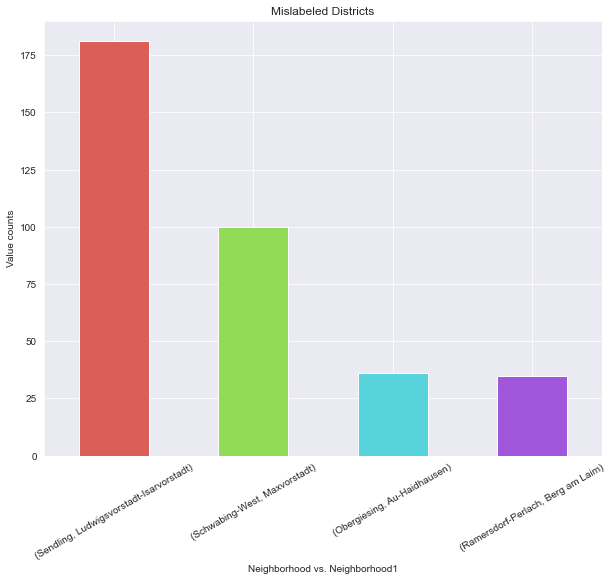

Neighborhood        Neighborhood1               
Sendling            Ludwigsvorstadt-Isarvorstadt    181
Schwabing-West      Maxvorstadt                     100
Obergiesing         Au-Haidhausen                    36
Ramersdorf-Perlach  Berg am Laim                     35
dtype: int64


In [46]:
incons_mask = dfx['Neighborhood1'] != dfx['Neighborhood']
dummy = dfx[incons_mask][['Neighborhood', 'Neighborhood1']]
dummy.value_counts()[:4].plot(kind = 'bar', figsize = (10,8), rot = 30, 
                              xlabel = 'Neighborhood vs. Neighborhood1', ylabel = 'Value counts',
                              color  = sns.color_palette("hls", 4),
                             title = "Mislabeled Districts")
plt.show()
print(dummy.value_counts()[:4])

About half of the inconsistencies stem from these four pairs. We can easily see that there's a big gap between the first pair and the second.  There's also a large gap between the first two pairs and the last two.

There 181 mismatches between Sendling and Ludwigvorstadt-Isarvorstadt, and 100 between Schwabing-West and Maxvorstadt. We can now override the **Neighborhood** column with **Neighborhood1**, drop **Neighborhood1**, and start the unsupervised learning part of the project.

In [47]:
dfx['Neighborhood'] = dfx['Neighborhood1']
dfx.drop(labels = 'Neighborhood1', axis = 1, inplace = True)

In [48]:
dfx.head() # data set all ready for the final stage of the project

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Allach-Untermenzing,48.193065,11.446326,Gasthaus zur Schießstätte,48.195601,11.456130,Bavarian Restaurant
1,Allach-Untermenzing,48.193065,11.446326,Sicilia,48.193331,11.459387,Italian Restaurant
2,Allach-Untermenzing,48.193065,11.446326,Franz-Albert-Park,48.191213,11.455887,Park
3,Allach-Untermenzing,48.193065,11.446326,Das Neue Tennis-Center-Allach e.K.,48.194746,11.456097,Tennis Court
4,Allach-Untermenzing,48.193065,11.446326,Spielplatz an der Schießstätte,48.195241,11.457088,Playground


In [49]:
# best save this DF and start the process next time from this point

# dfx.to_csv("dfx.csv", index = False)

dfx = pd.read_csv("dfx.csv")

# Exploratory Data Analysis

Now that we have an analysis-ready data frame, we can start querying our data to get answers to some questions.

What might be the 10 most frequent venue category in the city of Munich?

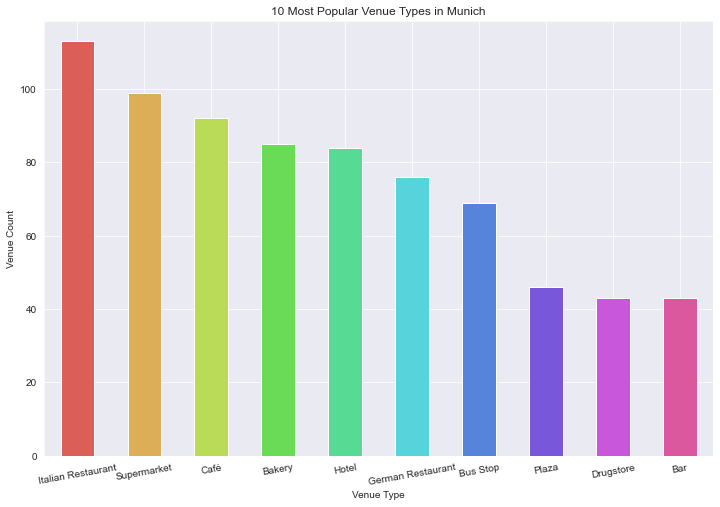

Italian Restaurant    113
Supermarket            99
Café                   92
Bakery                 85
Hotel                  84
German Restaurant      76
Bus Stop               69
Plaza                  46
Drugstore              43
Bar                    43
Name: Venue Category, dtype: int64


In [50]:
maskTemp = dfx.loc[:, ['Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']].duplicated(subset = ["Venue", "Venue Latitude", "Venue Longitude"])
dfx = dfx[~maskTemp]

dfx['Venue Category'].value_counts()[:10].plot(kind = 'bar', figsize = (12, 8),
                                               color = sns.color_palette("hls", 10),
                                               rot = 10,
                                               xlabel = "Venue Type", ylabel = "Venue Count",
                                               title = "10 Most Popular Venue Types in Munich")
plt.show()
print(dfx['Venue Category'].value_counts()[:10])

The result seems to corroborate my stay in Munich for the past three years; there are cafés everywhere, and Italian food seems to be in high demand by the inhabitants of Munich. 

Supermarkets and bakeries are everywhere; it also checks out.

What about the least popular venues in the city?

In [51]:
dfx['Venue Category'].value_counts()

Italian Restaurant        113
Supermarket                99
Café                       92
Bakery                     85
Hotel                      84
                         ... 
Men's Store                 1
Argentinian Restaurant      1
Butcher                     1
Astrologer                  1
Insurance Office            1
Name: Venue Category, Length: 260, dtype: int64

In [52]:
# how many different value counts do we have?
dfx['Venue Category'].value_counts().unique()

array([113,  99,  92,  85,  84,  76,  69,  46,  43,  32,  31,  29,  28,
        27,  26,  23,  22,  20,  19,  18,  17,  16,  15,  14,  13,  12,
        11,  10,   9,   8,   7,   6,   5,   4,   3,   2,   1], dtype=int64)

There are some venue types of which there is only a handful in the city. Let's take a look at some of them.

In [53]:
geringMask = np.isin(dfx['Venue Category'].value_counts(), [1,2,3])

dummy = dfx['Venue Category'].value_counts()[geringMask]

print(f"We have {dummy.shape[0]} venue types with 3 of fewer occurances in the city.")
dummy.keys().sort_values()[::10].values

We have 159 venue types with 3 of fewer occurances in the city.


array(['African Restaurant', 'Bagel Shop', 'Bus Line', 'Circus',
       'Cretan Restaurant', 'Donut Shop', 'Fish Market', 'Golf Course',
       'Indie Theater', 'Kids Store', 'Modern Greek Restaurant', 'Palace',
       'Portuguese Restaurant', 'Rock Club', 'Skating Rink', 'Theater'],
      dtype=object)

Some of these make sense, whereas some simply cannot be true.

- We definitely have more than 3 bus lines in the city:
    - The most frequent way a "Bus Line" appears in the column is "Bus Stop," hence the difference.

- Whereas it makes sense that very particular cuisines like Cretan cuisine or Portuguese cuisine might not be in high demand.

- There may be some missing venues not scanned by the radii given by the KDTree.

How do the figures change if we go down to the district level? To run meaningful aggregate queries, we will need to one-hot encode our data. Otherwise, we would be trying to sum up strings.

In [54]:
# one hot encoding
mun_onehot = pd.get_dummies(dfx[['Venue Category']], prefix = "", prefix_sep = "")

# add neighborhood column back to dataframe
mun_onehot['Neighborhood'] = dfx['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [mun_onehot.columns[-1]] + list(mun_onehot.columns[:-1])
mun_onehot = mun_onehot[fixed_columns]

mun_onehot.head() # 260 different venue types!

,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,...,Tunnel,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Waterfall,Wine Bar,Wine Shop,Women's Store,Xinjiang Restaurant,Yoga Studio
0,Allach-Untermenzing,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Allach-Untermenzing,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Allach-Untermenzing,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Allach-Untermenzing,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Allach-Untermenzing,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


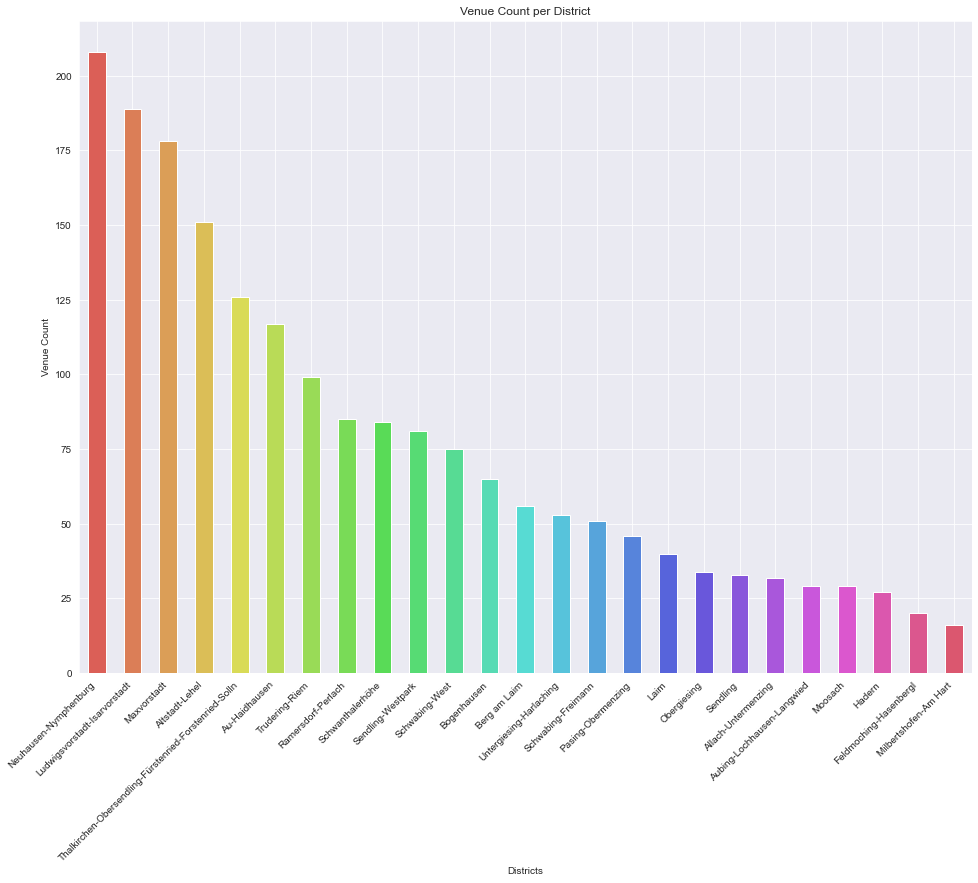

In [55]:
mun_onehot.groupby('Neighborhood').sum().sum(axis = 1).sort_values(ascending = False).plot(
    kind = 'bar', figsize = (16, 12), rot = 45, color = sns.color_palette("hls", 25),
    ylabel = "Venue Count", xlabel = "Districts", title = "Venue Count per District")
plt.xticks(ha = 'right')
plt.show()

In [56]:
# get the top three

print(mun_onehot.groupby('Neighborhood').sum().sum(axis = 1).sort_values(ascending = False)[:3])

Neighborhood
Neuhausen-Nymphenburg           208
Ludwigsvorstadt-Isarvorstadt    189
Maxvorstadt                     178
dtype: int64


In [57]:
def mostCommon(df, column, var, count):
    
    """Aggregates -the df- with respect to -the column-, gets -the var- group from the aggregated data,
    and returns -the count- (10 by default) most frequent value. 
    
    Will return venue types in my context.
    
    skip = 1 skips the string concatenation of the neighborhood names. 
    Will throw TypeError if set to < 1; no comparing integers and concatenated strings. 
    
    Pass the column and the var in as a string, e.g. 'The Neighborhood', 'The Column', etc.
    
    """
    
    skip = 1
    counts = df.groupby(column).get_group(var).sum(axis = 0)[skip:]
    counts = counts.sort_values(ascending = False)
    print("{} most frequent venues in {}: ".format(count, var))
    return counts[:count]

In [58]:
print(mostCommon(mun_onehot, 'Neighborhood', 'Neuhausen-Nymphenburg', 5))
print()
print(mostCommon(mun_onehot, 'Neighborhood', 'Ludwigsvorstadt-Isarvorstadt', 5))
print()
print(mostCommon(mun_onehot, 'Neighborhood', 'Maxvorstadt', 5))
print()
print(mostCommon(mun_onehot, 'Neighborhood', 'Altstadt-Lehel', 5))

5 most frequent venues in Neuhausen-Nymphenburg: 
Café                  15
Italian Restaurant    12
German Restaurant     12
Supermarket           11
Bakery                 9
dtype: object

5 most frequent venues in Ludwigsvorstadt-Isarvorstadt: 
Café                  19
Hotel                 12
Italian Restaurant    10
Supermarket            8
Bakery                 8
dtype: object

5 most frequent venues in Maxvorstadt: 
Café                     16
Bar                      15
Italian Restaurant       13
Restaurant                7
Vietnamese Restaurant     6
dtype: object

5 most frequent venues in Altstadt-Lehel: 
German Restaurant      10
Coffee Shop             7
Café                    7
Plaza                   6
Bavarian Restaurant     6
dtype: object


Although I will calculate the dissimilarities between districts and cluster them later in this notebook, the results here deserve some commentary. 

The city's venues seem to get concentrated around Nymphenburg, Isar-, and Maxvorstadt. There are multiple reasons for his: the historic center is here, both universities are here, the River Isar runs through here, entrance to the Englischer Garten is here, etc.  As you can see, out of the bunch, Ludwigsvorstadt-Isarvorstadt has the highest amount of hotels.

As an honorable mention, Aldtsadt comes in 4th place. The allure of the historic center should be self-explanatory. Please also note that the most frequent venue type here are restaurants that serve German cuisine, whereas this type of restaurant is not in the top 5 in the big three.

In [59]:
# get the bottom three

mun_onehot.groupby('Neighborhood').sum().sum(axis = 1).sort_values(ascending = False)[-3:]

Neighborhood
Hadern                    27
Feldmoching-Hasenbergl    20
Milbertshofen-Am Hart     16
dtype: int64

This also confirms what I expected. Hadern is a very quiet neighborhood and is filled with residential units. I can't say that Feldmoching (and especially Hasenbergl) is as quiet as Hadern, but one thing they have in common is that they are both residential areas.

The honorable mention in this category is Moosach. Besides the northern part of the district (which is home to the Olympia Einkaufszentrum), Moosach is usually populated by industrial areas (BMW Welt is here, BMW office is here, Thyssen-Krupp office is here), auto dealershis, auto repair shops, and so on.

In [60]:
print(mostCommon(mun_onehot, 'Neighborhood', 'Milbertshofen-Am Hart', 5))
print()
print(mostCommon(mun_onehot, 'Neighborhood', 'Feldmoching-Hasenbergl', 5))
print()
print(mostCommon(mun_onehot, 'Neighborhood', 'Hadern', 5))
print()
print(mostCommon(mun_onehot, 'Neighborhood', 'Moosach', 5))

5 most frequent venues in Milbertshofen-Am Hart: 
Clothing Store        2
Supermarket           2
Bakery                2
Falafel Restaurant    1
Trail                 1
dtype: object

5 most frequent venues in Feldmoching-Hasenbergl: 
Supermarket       3
Plaza             2
Bakery            2
Rental Service    1
Lake              1
dtype: object

5 most frequent venues in Hadern: 
Supermarket          5
Bus Stop             3
Plaza                2
German Restaurant    2
Tram Station         1
dtype: object

5 most frequent venues in Moosach: 
Supermarket        7
Bus Stop           5
Bakery             2
Automotive Shop    1
Auto Garage        1
dtype: object


Let's create a word cloud out of the frequency of each venue type in Munich.

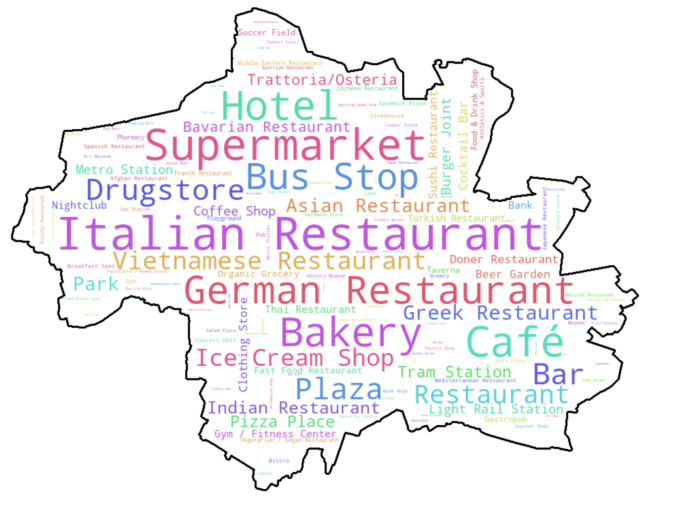

In [61]:
from PIL import Image
import os
from wordcloud import WordCloud

freqDict = dfx['Venue Category'].value_counts().to_dict()

munMask = np.array(Image.open("./Stadtgrenzen_Muenchen.PNG"))

wc = WordCloud(background_color = "white", max_words = 1000, 
               mask = munMask, contour_width = 1.5, 
               contour_color = 'black', colormap = sns.color_palette("hls", 260, as_cmap = True))

wc.generate_from_frequencies(freqDict)
plt.figure(figsize = (12, 10))
plt.imshow(wc, interpolation = "gaussian")
plt.axis("off")
plt.show()

Next, let's group rows by neighborhood by taking the mean of the frequency of occurrence of each venue type.

The assumption here is that a district could be characterized by the frequency of the different venues it hosts.

In [62]:
mun_grouped = mun_onehot.groupby('Neighborhood').mean().reset_index()

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns = columns)
neighborhoods_venues_sorted['Neighborhood'] = mun_grouped['Neighborhood']

for ind in np.arange(mun_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(mun_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allach-Untermenzing,Italian Restaurant,Supermarket,Bus Stop,Drugstore,Park,Bakery,Pharmacy,Sporting Goods Shop,Miscellaneous Shop,Food & Drink Shop
1,Altstadt-Lehel,German Restaurant,Coffee Shop,Café,Plaza,Bavarian Restaurant,Italian Restaurant,Bar,Clothing Store,Pizza Place,Gourmet Shop
2,Au-Haidhausen,Italian Restaurant,Plaza,Bakery,Café,Ice Cream Shop,Bar,German Restaurant,Indian Restaurant,Turkish Restaurant,Hotel
3,Aubing-Lochhausen-Langwied,Bus Stop,Supermarket,Bowling Alley,Asian Restaurant,Light Rail Station,Rest Area,Park,Big Box Store,Pet Store,Hardware Store
4,Berg am Laim,Nightclub,Supermarket,Hotel,Bakery,Tram Station,Bavarian Restaurant,Bar,Climbing Gym,Drugstore,Italian Restaurant


I'll determine the dissimilarity between each neighborhood depending on the frequency of occurrence of their most common venues.

# Clustering

The most significant disadvantage of the KMeans is that we need to predetermine a cluster number. Depending on how the center point of each cluster is initialized (a random process), our clusters may look very different in each iteration. As such, KMeans doesn't guarantee a global optimum.

KMeans algorithm tries to maximize inter-group variance while minimizing the intra-group variance. The easiest way to achieve this is with a high number of K. As such, the error function of the KMeans clustering algorithm is a monotonically decreasing one. We can pick "the best" K by plotting the error produced by the algorithm against different K values.  

The trick here is not to use an absurd amount of K but to look for that one "elbow point" where we get the sharpest drop in the error and not increase K beyond that point.

In [63]:
errors = []
mun_grouped_clustering = mun_grouped.drop('Neighborhood', 1)

K = range(1,26) # from the entire city as one big blob to 1 cluster per district
for k in K:
    kmeans = KMeans(n_clusters = k, random_state = 42).fit(mun_grouped_clustering)
    errors.append(kmeans.inertia_)

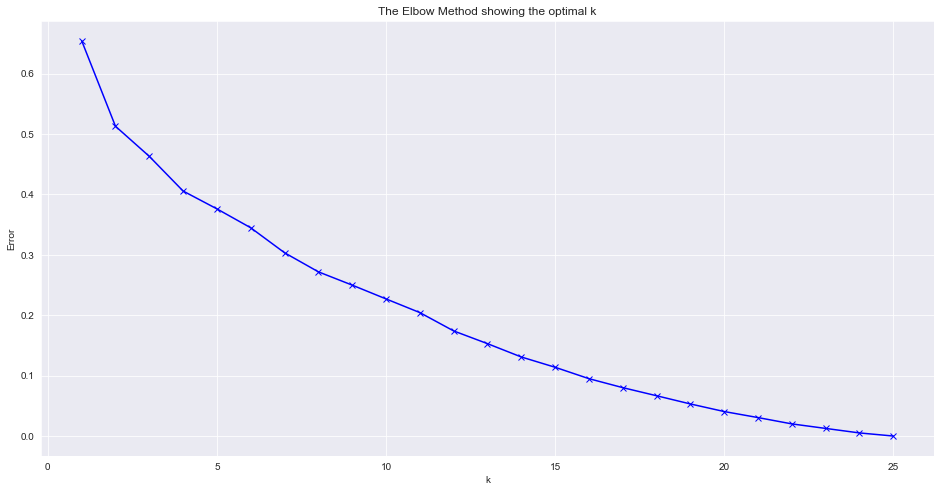

In [64]:
plt.figure(figsize=(16,8))
plt.plot(K, errors, 'bx-')
plt.xlabel('k')
plt.ylabel('Error')
plt.title('The Elbow Method showing the optimal k')
plt.show()

The elbow point seems to be around K = 2. However, there are some marginal gains as K increases. The reduction in distortion seems to level out after 5 clusters. I'll take a look at any number of clusters between 2 and 5.

# K - trial and error

## K = 2

In [65]:
Latitude = 48.137154
Longitude = 11.576124

In [67]:
kclusters = 2

kmeansFinal = KMeans(n_clusters = kclusters, random_state = 42).fit(mun_grouped_clustering)

# this piece is to reset the data frame
# neighborhoods_venues_sorted.drop(labels = 'Cluster Labels', inplace = True, axis = 1)
# mun_merged.drop(labels = 'Cluster Labels', inplace = True, axis = 1)

# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeansFinal.labels_)

mun_merged = dfx

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
mun_merged = mun_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on = 'Neighborhood')

mun_merged.head() # check the last columns!

# create map
map_clusters = folium.Map(location = [Latitude, Longitude], zoom_start = 11) # munich city map, again

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(mun_merged['Neighborhood Latitude'], mun_merged['Neighborhood Longitude'], mun_merged['Neighborhood'], mun_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster + 1), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius = 5,
        popup = label,
        color = rainbow[cluster - 1],
        fill = True,
        fill_color = rainbow[cluster - 1],
        fill_opacity = 0.7).add_to(map_clusters)
       
map_clusters

Separating the city from one big cluster to two clusters offered the biggest reduction in distortion. Let's dive a bit further and examine the clusters!

### Cluster 1

In [68]:
c1 = mun_merged.loc[mun_merged['Cluster Labels'] == 0, mun_merged.columns[[0] + list(range(6, mun_merged.shape[1]))]]

c1list = c1.Neighborhood.unique()
for nb in c1list[::2]:
    display(c1.loc[c1.Neighborhood == nb].sample(1))

,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Allach-Untermenzing,Italian Restaurant,0,Italian Restaurant,Supermarket,Bus Stop,Drugstore,Park,Bakery,Pharmacy,Sporting Goods Shop,Miscellaneous Shop,Food & Drink Shop


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
300,Feldmoching-Hasenbergl,Italian Restaurant,0,Supermarket,Plaza,Bakery,Rental Service,Lake,Bus Line,Café,Gas Station,Tennis Court,Market


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
309,Hadern,Food & Drink Shop,0,Supermarket,Bus Stop,Plaza,German Restaurant,Tram Station,Light Rail Station,Metro Station,Fast Food Restaurant,Food & Drink Shop,Café


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
680,Laim,Caucasian Restaurant,0,Supermarket,Bus Stop,Bank,Bakery,Light Rail Station,Tram Station,Motorcycle Shop,Burger Joint,Hardware Store,Sushi Restaurant


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1667,Thalkirchen-Obersendling-Fürstenried-Forstenri...,Supermarket,0,Supermarket,Bakery,Bus Stop,Italian Restaurant,Drugstore,German Restaurant,Hotel,Ice Cream Shop,Gas Station,Café


This cluster seems to capture residential areas of munich where most frequenty venue types are markets, bakeries, and bus stops, with occasional restaurants and hotels sprinkled in. Note the rail and metro stations in some of the districts.

## Cluster 2

In [69]:
c2 = mun_merged.loc[mun_merged['Cluster Labels'] == 1, mun_merged.columns[[0] + list(range(6, mun_merged.shape[1]))]]
c2list = c2.Neighborhood.unique()
for nb in c2list:
    display(c2.loc[c2.Neighborhood == nb].sample(1))

,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
932,Altstadt-Lehel,Organic Grocery,1,German Restaurant,Coffee Shop,Café,Plaza,Bavarian Restaurant,Italian Restaurant,Bar,Clothing Store,Pizza Place,Gourmet Shop


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1460,Ludwigsvorstadt-Isarvorstadt,Afghan Restaurant,1,Café,Hotel,Italian Restaurant,Supermarket,Bakery,German Restaurant,Cocktail Bar,Bar,Restaurant,Burger Joint


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
630,Au-Haidhausen,Park,1,Italian Restaurant,Plaza,Bakery,Café,Ice Cream Shop,Bar,German Restaurant,Indian Restaurant,Turkish Restaurant,Hotel


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
842,Berg am Laim,Discount Store,1,Nightclub,Supermarket,Hotel,Bakery,Tram Station,Bavarian Restaurant,Bar,Climbing Gym,Drugstore,Italian Restaurant


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
235,Bogenhausen,Hotel,1,Italian Restaurant,Bakery,German Restaurant,Hotel,Restaurant,Tram Station,Bus Stop,Indian Restaurant,Park,Café


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1112,Maxvorstadt,Chinese Restaurant,1,Café,Bar,Italian Restaurant,Restaurant,Vietnamese Restaurant,Bakery,Cocktail Bar,Asian Restaurant,Plaza,History Museum


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
569,Neuhausen-Nymphenburg,Pool Hall,1,Café,Italian Restaurant,German Restaurant,Supermarket,Bakery,Trattoria/Osteria,Indian Restaurant,Park,Vietnamese Restaurant,Greek Restaurant


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
647,Obergiesing,Organic Grocery,1,Italian Restaurant,Hotel,Supermarket,Restaurant,Plaza,German Restaurant,Pizza Place,Greek Restaurant,Bistro,Gym / Fitness Center


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1261,Schwanthalerhöhe,Pizza Place,1,Café,Hotel,Italian Restaurant,German Restaurant,Pizza Place,Ice Cream Shop,Asian Restaurant,Steakhouse,Bakery,Vietnamese Restaurant


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1563,Sendling-Westpark,Café,1,Hotel,Bakery,Bus Stop,Supermarket,Drugstore,Greek Restaurant,Italian Restaurant,Restaurant,Café,Hardware Store


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
730,Pasing-Obermenzing,Drugstore,1,German Restaurant,Hotel,Bus Stop,Supermarket,Bakery,Italian Restaurant,Drugstore,Automotive Shop,Taverna,Tennis Court


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1903,Untergiesing-Harlaching,Trail,1,German Restaurant,Bus Stop,Bakery,Soccer Field,Taverna,Plaza,Italian Restaurant,Athletics & Sports,Supermarket,Metro Station


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1138,Schwabing-Freimann,Asian Restaurant,1,Hotel,Italian Restaurant,German Restaurant,Greek Restaurant,Breakfast Spot,Café,Supermarket,Indie Theater,Gym / Fitness Center,Food & Drink Shop


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1010,Schwabing-West,Bar,1,Italian Restaurant,Thai Restaurant,Vietnamese Restaurant,Café,Trattoria/Osteria,Hotel,Indian Restaurant,Bar,Greek Restaurant,Mexican Restaurant


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1515,Sendling,Tour Provider,1,Italian Restaurant,Gastropub,Bakery,Vietnamese Restaurant,Food & Drink Shop,Spanish Restaurant,Bosnian Restaurant,Grocery Store,German Restaurant,Sporting Goods Shop


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1850,Trudering-Riem,Sports Club,1,Hotel,Supermarket,Drugstore,Italian Restaurant,Clothing Store,Fried Chicken Joint,Golf Course,Indian Restaurant,German Restaurant,Ice Cream Shop


The Elbow point seemed to be K = 2. However, this cluster doesn't sit well with me. Trudering-Riem and Maxvorstadt in the same cluster don't make much sense. Trudering-Riem is, for the most part, a residential district, whereas Maxvorstadt is the central borough (their top three also tell different stories). Another example; Bogenhausen is a relatively upscale area of the city, whereas Sendling is a comparatively residential area.

This cluster tried to group districts with a high frequency of restaurants, cafés, and bars. It looks like the low number of K forced somewhat unrelated districts into this one. For instance, Trudering-Riem is a very different district from Sendling, yet they are in the same cluster. Since Riem's most frequent venue type is hotels, KMeans clustered these two together in one group.

I'll increment the K by one and see if 3 clusters make sense and represent the real-life Munich better.

## K = 3

In [70]:
kclusters = 3

kmeansFinal = KMeans(n_clusters = kclusters, random_state = 42).fit(mun_grouped_clustering)

# this piece is to reset the data frame
neighborhoods_venues_sorted.drop(labels = 'Cluster Labels', inplace = True, axis = 1)
mun_merged.drop(labels = 'Cluster Labels', inplace = True, axis = 1)

# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeansFinal.labels_)

mun_merged = dfx

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
mun_merged = mun_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on = 'Neighborhood')

mun_merged.head() # check the last columns!

# create map
map_clusters = folium.Map(location = [Latitude, Longitude], zoom_start = 11) # munich city map, again

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(mun_merged['Neighborhood Latitude'], mun_merged['Neighborhood Longitude'], mun_merged['Neighborhood'], mun_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster + 1), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius = 5,
        popup = label,
        color = rainbow[cluster - 1],
        fill = True,
        fill_color = rainbow[cluster - 1],
        fill_opacity = 0.7).add_to(map_clusters)
       
map_clusters

This one seems a bit more interesting; the districts with the outdoor venues, historic sites, high-end shops, and the nightlife attractions got clustered together (Cluster 1). Residential districts were separated into two different clusters. I more or less know what I'm going to find in Cluster 1, so I want to focus on the difference between Cluster 2 and Cluster 3 to try and understand why KMeans saw it fit to separate them into their separate groups.

### Cluster 2

In [71]:
c2 = mun_merged.loc[mun_merged['Cluster Labels'] == 1, mun_merged.columns[[0] + list(range(6, mun_merged.shape[1]))]]
c2list = c2.Neighborhood.unique()
for nb in c2list:
    display(c2.loc[c2.Neighborhood == nb].sample(1))

,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
793,Allach-Untermenzing,Indian Restaurant,1,Italian Restaurant,Supermarket,Bus Stop,Drugstore,Park,Bakery,Pharmacy,Sporting Goods Shop,Miscellaneous Shop,Food & Drink Shop


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
279,Feldmoching-Hasenbergl,Supermarket,1,Supermarket,Plaza,Bakery,Rental Service,Lake,Bus Line,Café,Gas Station,Tennis Court,Market


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
961,Milbertshofen-Am Hart,Italian Restaurant,1,Clothing Store,Supermarket,Bakery,Falafel Restaurant,Trail,Burger Joint,Italian Restaurant,Park,Forest,Asian Restaurant


### Cluster 3

In [72]:
c2 = mun_merged.loc[mun_merged['Cluster Labels'] == 2, mun_merged.columns[[0] + list(range(6, mun_merged.shape[1]))]]
c2list = c2.Neighborhood.unique()
for nb in c2list:
    display(c2.loc[c2.Neighborhood == nb].sample(1))

,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
739,Aubing-Lochhausen-Langwied,Bakery,2,Bus Stop,Supermarket,Bowling Alley,Asian Restaurant,Light Rail Station,Rest Area,Park,Big Box Store,Pet Store,Hardware Store


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
713,Hadern,Drugstore,2,Supermarket,Bus Stop,Plaza,German Restaurant,Tram Station,Light Rail Station,Metro Station,Fast Food Restaurant,Food & Drink Shop,Café


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
431,Moosach,Bus Stop,2,Supermarket,Bus Stop,Bakery,Automotive Shop,Auto Garage,Gym / Fitness Center,Park,Hardware Store,Pet Store,Light Rail Station


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
625,Laim,Train Station,2,Supermarket,Bus Stop,Bank,Bakery,Light Rail Station,Tram Station,Motorcycle Shop,Burger Joint,Hardware Store,Sushi Restaurant


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
817,Ramersdorf-Perlach,Bus Stop,2,Bus Stop,Supermarket,German Restaurant,Hotel,Bakery,Italian Restaurant,Soccer Field,Metro Station,Turkish Restaurant,Plaza


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1687,Thalkirchen-Obersendling-Fürstenried-Forstenri...,Pizza Place,2,Supermarket,Bakery,Bus Stop,Italian Restaurant,Drugstore,German Restaurant,Hotel,Ice Cream Shop,Gas Station,Café


The main difference between Cluster 2 and Cluster 3 seems to be that bus stops are more frequent in the districts in Cluster 3. Everything else is similar since both are residential districts. One thing to note here is that districts like Laim and Moosach host more business venues than the districts in Cluster 2.

3 clusters seem to be doing fine. Let's see what happens with K = 4.

## K = 4

In [73]:
kclusters = 4

kmeansFinal = KMeans(n_clusters = kclusters, random_state = 42).fit(mun_grouped_clustering)

# this piece is to reset the data frame
neighborhoods_venues_sorted.drop(labels = 'Cluster Labels', inplace = True, axis = 1)
mun_merged.drop(labels = 'Cluster Labels', inplace = True, axis = 1)

# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeansFinal.labels_)

mun_merged = dfx

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
mun_merged = mun_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on = 'Neighborhood')

mun_merged.head() # check the last columns!

# create map
map_clusters = folium.Map(location = [Latitude, Longitude], zoom_start = 11) # munich city map, again

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(mun_merged['Neighborhood Latitude'], mun_merged['Neighborhood Longitude'], mun_merged['Neighborhood'], mun_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster + 1), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius = 5,
        popup = label,
        color = rainbow[cluster - 1],
        fill = True,
        fill_color = rainbow[cluster - 1],
        fill_opacity = 0.7).add_to(map_clusters)
       
map_clusters

K = 4 clusters seem to make things weirder than they should be. It causes two very minor clusters, with two or fewer districts. It looks like increasing K beyond 3 decreases the distortion by starting to shape clusters around each of the twenty-five districts. 

In the new model, Trudering-Riem and Berg am Laim have left the old city/boujie cluster and joined the other residential districts of the city: for example, Untermenzing. Let's dive a bit deeper to understand what's going on. 

I want to check the reasons behind what might have caused KMeans two form Cluster 2 (only Moosach and Hadern) and Cluster 4 (only Milbertshofen-Am Hart).

When K was equal to three, Milbertshofen-Am Hart was clustered alongside Feldmoching-Hasenbergl. With K = 4, Milbertshofen-Am Hart was given its very own cluster. What's so different about between Cluster 4 and Cluster 1 (Feldmoching cluster) then?

### Cluster 1 and Cluster 4

In [74]:
print("Cluster 1")
c1 = mun_merged.loc[mun_merged['Cluster Labels'] == 0, mun_merged.columns[[0] + list(range(6, mun_merged.shape[1]))]]
c1list = c1.Neighborhood.unique()
for nb in c1list:
    display(c1.loc[c1.Neighborhood == nb].sample(1))

print("Cluster 4")
c4 = mun_merged.loc[mun_merged['Cluster Labels'] == 3, mun_merged.columns[[0] + list(range(6, mun_merged.shape[1]))]]
c4list = c4.Neighborhood.unique()
for nb in c4list:
    display(c4.loc[c4.Neighborhood == nb].sample(1))

Cluster 1


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
434,Allach-Untermenzing,Vietnamese Restaurant,0,Italian Restaurant,Supermarket,Bus Stop,Drugstore,Park,Bakery,Pharmacy,Sporting Goods Shop,Miscellaneous Shop,Food & Drink Shop


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
729,Aubing-Lochhausen-Langwied,Supermarket,0,Bus Stop,Supermarket,Bowling Alley,Asian Restaurant,Light Rail Station,Rest Area,Park,Big Box Store,Pet Store,Hardware Store


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
187,Berg am Laim,Supermarket,0,Nightclub,Supermarket,Hotel,Bakery,Tram Station,Bavarian Restaurant,Bar,Climbing Gym,Drugstore,Italian Restaurant


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
291,Feldmoching-Hasenbergl,Market,0,Supermarket,Plaza,Bakery,Rental Service,Lake,Bus Line,Café,Gas Station,Tennis Court,Market


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1544,Laim,Hotel,0,Supermarket,Bus Stop,Bank,Bakery,Light Rail Station,Tram Station,Motorcycle Shop,Burger Joint,Hardware Store,Sushi Restaurant


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1604,Sendling-Westpark,Tennis Court,0,Hotel,Bakery,Bus Stop,Supermarket,Drugstore,Greek Restaurant,Italian Restaurant,Restaurant,Café,Hardware Store


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
730,Pasing-Obermenzing,Drugstore,0,German Restaurant,Hotel,Bus Stop,Supermarket,Bakery,Italian Restaurant,Drugstore,Automotive Shop,Taverna,Tennis Court


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1918,Untergiesing-Harlaching,Bus Stop,0,German Restaurant,Bus Stop,Bakery,Soccer Field,Taverna,Plaza,Italian Restaurant,Athletics & Sports,Supermarket,Metro Station


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
887,Ramersdorf-Perlach,Hotel,0,Bus Stop,Supermarket,German Restaurant,Hotel,Bakery,Italian Restaurant,Soccer Field,Metro Station,Turkish Restaurant,Plaza


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1733,Thalkirchen-Obersendling-Fürstenried-Forstenri...,German Restaurant,0,Supermarket,Bakery,Bus Stop,Italian Restaurant,Drugstore,German Restaurant,Hotel,Ice Cream Shop,Gas Station,Café


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1758,Trudering-Riem,Supermarket,0,Hotel,Supermarket,Drugstore,Italian Restaurant,Clothing Store,Fried Chicken Joint,Golf Course,Indian Restaurant,German Restaurant,Ice Cream Shop


Cluster 4


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
387,Milbertshofen-Am Hart,Park,3,Clothing Store,Supermarket,Bakery,Falafel Restaurant,Trail,Burger Joint,Italian Restaurant,Park,Forest,Asian Restaurant


The main difference between Cluster 1 and Cluster 4 is that Cluster 1 seems to contain more nightlife and business venues while hosting residential areas. Milbertshofen was separated into a separate cluster because the most frequent venue type is clothing stores (none of the Cluster 4 districts have a clothing store in the 3 most common venue types).

Cluster 4 is further differentiated from Cluster 1 through the presence of trails and a forest.

The final question to answer: what's exceptional about Hadern and Moosach (Cluster 2), and what sets them apart from Cluster 1 (they used to be part of this cluster when K = 3).

### Cluster 2

In [75]:
print("Cluster 2")
c2 = mun_merged.loc[mun_merged['Cluster Labels'] == 1, mun_merged.columns[[0] + list(range(6, mun_merged.shape[1]))]]
c2list = c2.Neighborhood.unique()
for nb in c2list:
    display(c2.loc[c2.Neighborhood == nb].sample(1))

Cluster 2


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
713,Hadern,Drugstore,1,Supermarket,Bus Stop,Plaza,German Restaurant,Tram Station,Light Rail Station,Metro Station,Fast Food Restaurant,Food & Drink Shop,Café


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
425,Moosach,Bus Stop,1,Supermarket,Bus Stop,Bakery,Automotive Shop,Auto Garage,Gym / Fitness Center,Park,Hardware Store,Pet Store,Light Rail Station


The thing that stands out is that they share the top two most common venue types. Moosach is full of automative related businesses and hardware stores. Hadern seems to include many transportation possibilities. Given a chance, KMeans will pick up on these traits and separate them.

### Cluster 3

In [76]:
print("Cluster 3")
c3 = mun_merged.loc[mun_merged['Cluster Labels'] == 2, mun_merged.columns[[0] + list(range(6, mun_merged.shape[1]))]]
c3list = c3.Neighborhood.unique()
for nb in c3list:
    display(c3.loc[c3.Neighborhood == nb].sample(1))

Cluster 3


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
98,Altstadt-Lehel,Bar,2,German Restaurant,Coffee Shop,Café,Plaza,Bavarian Restaurant,Italian Restaurant,Bar,Clothing Store,Pizza Place,Gourmet Shop


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1366,Ludwigsvorstadt-Isarvorstadt,Pub,2,Café,Hotel,Italian Restaurant,Supermarket,Bakery,German Restaurant,Cocktail Bar,Bar,Restaurant,Burger Joint


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
111,Au-Haidhausen,Italian Restaurant,2,Italian Restaurant,Plaza,Bakery,Café,Ice Cream Shop,Bar,German Restaurant,Indian Restaurant,Turkish Restaurant,Hotel


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
275,Bogenhausen,Wine Shop,2,Italian Restaurant,Bakery,German Restaurant,Hotel,Restaurant,Tram Station,Bus Stop,Indian Restaurant,Park,Café


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1216,Maxvorstadt,Asian Restaurant,2,Café,Bar,Italian Restaurant,Restaurant,Vietnamese Restaurant,Bakery,Cocktail Bar,Asian Restaurant,Plaza,History Museum


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
541,Neuhausen-Nymphenburg,Turkish Restaurant,2,Café,Italian Restaurant,German Restaurant,Supermarket,Bakery,Trattoria/Osteria,Indian Restaurant,Park,Vietnamese Restaurant,Greek Restaurant


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
807,Obergiesing,Supermarket,2,Italian Restaurant,Hotel,Supermarket,Restaurant,Plaza,German Restaurant,Pizza Place,Greek Restaurant,Bistro,Gym / Fitness Center


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1304,Schwanthalerhöhe,Plaza,2,Café,Hotel,Italian Restaurant,German Restaurant,Pizza Place,Ice Cream Shop,Asian Restaurant,Steakhouse,Bakery,Vietnamese Restaurant


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1159,Schwabing-Freimann,Plaza,2,Hotel,Italian Restaurant,German Restaurant,Greek Restaurant,Breakfast Spot,Café,Supermarket,Indie Theater,Gym / Fitness Center,Food & Drink Shop


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1029,Schwabing-West,Supermarket,2,Italian Restaurant,Thai Restaurant,Vietnamese Restaurant,Café,Trattoria/Osteria,Hotel,Indian Restaurant,Bar,Greek Restaurant,Mexican Restaurant


,Neighborhood,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1514,Sendling,Kids Store,2,Italian Restaurant,Gastropub,Bakery,Vietnamese Restaurant,Food & Drink Shop,Spanish Restaurant,Bosnian Restaurant,Grocery Store,German Restaurant,Sporting Goods Shop


## K = 5

In [77]:
kclusters = 5

kmeansFinal = KMeans(n_clusters = kclusters, random_state = 42).fit(mun_grouped_clustering)

# this piece is to reset the data frame
neighborhoods_venues_sorted.drop(labels = 'Cluster Labels', inplace = True, axis = 1)
mun_merged.drop(labels = 'Cluster Labels', inplace = True, axis = 1)

# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeansFinal.labels_)

mun_merged = dfx

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
mun_merged = mun_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on = 'Neighborhood')

mun_merged.head() # check the last columns!

# create map
map_clusters = folium.Map(location = [Latitude, Longitude], zoom_start = 11) # munich city map, again

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(mun_merged['Neighborhood Latitude'], mun_merged['Neighborhood Longitude'], mun_merged['Neighborhood'], mun_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster + 1), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius = 5,
        popup = label,
        color = rainbow[cluster - 1],
        fill = True,
        fill_color = rainbow[cluster - 1],
        fill_opacity = 0.7).add_to(map_clusters)
       
map_clusters

K = 5 keeps the residential and entertainment clusters more or less the same. Feldmoching got separated into its sub-cluster. The difference is now Berg am Laim also gets its own cluster. Berg am Laim's differences from the others were apparent in the previous K = 4 example. 

Since increasing K from 4 to 5 didn't move the labels notably and instead resulted in somewhat insignificant changes to one of the clusters: I'll stop the K here. Although Feldmoching having its own cluster is a tad weird, the separation between residential areas vs. downtown Munich is better when K = 4, so I will allow Feldmoching to have its separate cluster.

In the final iteration, where K = 4:

- Cluster 1 captures the residential areas of the city that also happens to host some business venues. For example, media companies and banks in Laim or the BMW office in Feldmoching are good examples, on top of the residential units in the district. 


- Cluster 2 captures a unique portion of the city, where residential blocks lie alongside public transportation and automobile workshop venues.


- Cluster 3 includes the city center, historic areas of the city, and areas where business and nightlife venues are located. This cluster comprises the high-end part of the city and downtown Munich.

- Cluster 4 is the Milbertshofen-Am Hart cluster; this cluster is characterized by the high frequency of clothing stores and the existence of a trail and forest.  

# Conclusion

This has been a rather lengthy one for a first notebook. I completed this project for the IBM Data Science specialization on Coursera. 

This project comprises:

 - Scraping data off the internet
 - Making multiple calls to Foursquare and Google Maps API to populate a data frame
 - Cleaning, munging, and wrangling data to make it uniform and analysis-ready
 - Validating the clean data
 - Exploratory data analysis to query our data before analysis
 - Data visualizations to enhance the story told through EDA
 - Using unsupervised learning to cluster neighborhoods of Munich in a true-to-life manner
 
 I hope you enjoyed reading through the notebook as much as I enjoyed writing it. See you in the next one!